# <h1><center> Part 1 - Background and methodology </center></h1>

<font size="4">
The United Arab List (RAM; in Arabic: The United Arab List, al-Qa'ima al-Arabiya al-Muhadda) is an Arab-Islamic party that was established in preparation for the elections to the 14th Knesset (May 1996). Since then, members of the list are individuals from among the southern faction of The Islamic movement, the Mada party and others.
Ream is actually one of the three prominent Arab parties in Israeli politics.

The party list for the Knesset is chosen by the Shura Council of the southern faction in the Islamic Movement.
The party enjoys great sympathy among the Bedouin public, and is considered the most pragmatic of the Arab parties in relation to cooperation with Jewish Zionist and even nationalist parties. Meanwhile, the party sat in the previous coalition under Naftali Bennett's Right Party and then under Yesh Atid's Yesh Atid.

The data files we used for the report:
</font>

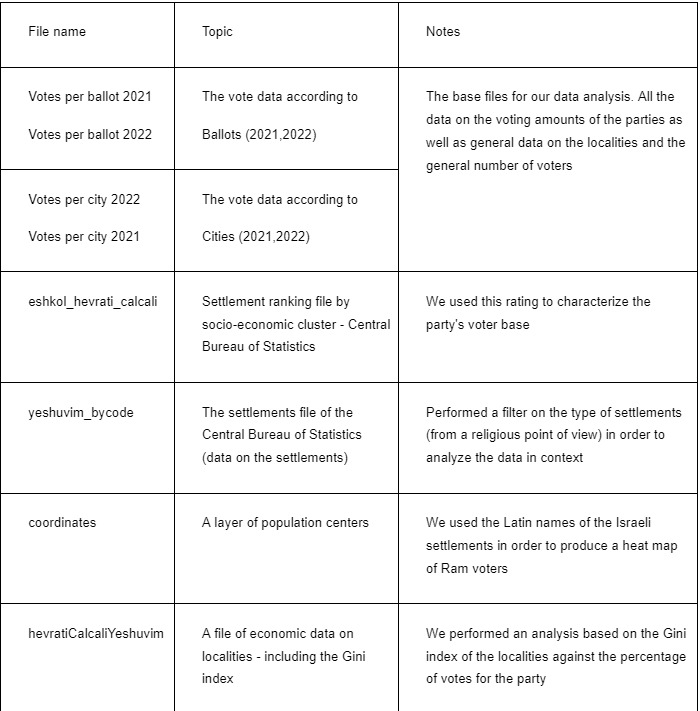

In [13]:
display.Image("https://raw.githubusercontent.com/galsalo/statistics_labs/main/methodology.jpeg")

<font size="4">
Pre-processing we performed for the data:
<ul>
  <li>Removal of external envelopes - throughout most of the work the data processing was without external envelopes (Part 3 onwards).</li>
  <li>Creating a dictionary of the names of the parties - in order to convert the letters of the note into the names of the parties for presentation clear and informative of the data.</li>
  <li>Invalid votes - these votes are not counted as part of the kosher votes in the elections.</li>
  <li>HCA index identifier for the town ("Settlement symbol") and for the ballot box ("Settlement symbol"), "Ballot number", "Settlement name"</li>
  <li>social-economic ranking - we made a comparison between the existing settlements in the cluster social-economic and the existing localities in the election files for the year 2022 and we made a cut according to the cities, so a settlement that did not appear in both files was removed from the data.</li>
  <li>We used google API in order to obtain DD coordinates for cities in Israel, which was not available online in a working format.</li>
</ul>
</font>

In [122]:
import json
import plotly.io as pio
from IPython import display
import warnings
#----------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from geopy.geocoders import GoogleV3
import plotly.graph_objects as go
from scipy import stats
from scipy.optimize import nnls
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import plotly.express as px
#----------------------------
warnings.filterwarnings('ignore')

# <h1><center> Part 2 - Changes from last elections </center></h1>
<font size="4">

In the background of the last three election sets, in our opinion it is vital to note the entry of Mansour Abbas into the position of the chairman of the party in April 2019 under the name Ra'am - Balad.

Meanwhile, running for the Knesset as part of the 2020 elections (the 23rd Knesset), the Ra'am party was registered as part of the joint list and won 4 mandates out of 15 of the entire list.

However, during the election campaign for the twenty-fourth Knesset (March 2021), Chairman Mansour Abbas decided to lead the party to withdraw from the joint list and run independently.

</font>


In [15]:
geolocator = GoogleV3(api_key=json.load(open("secrets.json"))['key'])       # it will not work without the secrets.json file
def return_coor(city_name):     # a function to get the coordinates from Google api
  location = geolocator.geocode(f"{city_name}, Israel")
  try:
    lat, lon = location.latitude, location.longitude
  except:
    lat, lon = None, None
  return [lat, lon]

df_city_22 = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes_22.csv")
parties_dict_2022 = { 'מחל':'ליכוד', 'פה':'יש עתיד', 'שס':'שס', 'כן':'המחנה הממלכתי', 'ב':'הבית היהודי', 'אמת':'עבודה', 'ג':'יהדות התורה', 'ל':'ישראל ביתנו', 'ט':'ציונות דתית',
                      'ום':'חדש תעל', 'מרצ':'מרצ', 'עם':'רעם', 'ד' : 'בלד', 'קלפי' : "קלפי" , 'שם ישוב':"שם ישוב" }
df_city_22.rename(columns=parties_dict_2022, inplace=True)
df_city_22 = df_city_22[df_city_22['שם ישוב'] != "מעטפות חיצוניות"]

map = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/coordinates.csv")
map = map.merge(df_city_22, on=['סמל ישוב','שם ישוב'])
map.rename(columns={'שם ישוב בלטינית':'latin_name','שם ישוב': 'city','רעם': 'votes'}, inplace=True)

In [16]:
map['initial_cor'] = map['latin_name'].apply(return_coor)
tempo = pd.DataFrame(map['initial_cor'].to_list(), columns=['latitude','longitude'])
map['latitude'], map['longitude'] = tempo['latitude'], tempo['longitude']

In [17]:
def plot_votes_by_location(data_frame):
    # create map and display it
    israel_map = folium.Map(width=2100,height=700, location=[31.0461, 34.8516], zoom_start=7)
    # display the map of Israel
    israel_map
    # filter the DataFrame to only include rows with a votes greater than 0
    data_frame = data_frame[data_frame['votes'] > 0]
    data_frame = data_frame[['latitude', 'longitude', 'votes']].to_numpy()
    # plot heatmap
    HeatMap(data=data_frame, radius=8, max_zoom=13, ).add_to(israel_map)
    # display the map
    return israel_map

<font size="4">
We would be happy to open the analysis on the Raam party in a heat map of the amounts of votes for the party.
The analysis is done by extracting the longitude and latitude coordinates with the help of Google API through a function we built.

After that, we cross-referenced the location data of the localities with the voting data for the party in each locality and created the heat map.

From the analysis of the heat map (interactive map) it is evident that most of the voters for Raam come from the Israeli periphery, from Arab and Bedouin communities.
</font>

In [18]:
plot_votes_by_location(map)

In [19]:
bal_22 = pd.read_csv('https://raw.githubusercontent.com/galsalo/statistics_labs/main/election%2022%20by%20kalpi.csv')
bal_21 = pd.read_csv('https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes%20per%20ballot%202021%20-%20votes%20per%20ballot%202021.csv')
parties_dict_2022 = { 'מחל':'ליכוד', 'פה':'יש עתיד', 'שס':'שס', 'כן':'המחנה הממלכתי', 'ב':'הבית היהודי', 'אמת':'עבודה', 'ג':'יהדות התורה', 'ל':'ישראל ביתנו', 'ט':'ציונות דתית',
                      'ום':'חדש תעל', 'מרצ':'מרצ', 'עם':'רעם', 'ד' : 'בלד', 'קלפי' : "קלפי" , 'שם ישוב':"שם ישוב" }
bal_22.rename(columns=parties_dict_2022, inplace=True)
bal_22 = bal_22[bal_22['שם ישוב'] != "מעטפות חיצוניות"]
bal_22 = bal_22[[name for name in bal_22.columns if name in parties_dict_2022.values()]]


parties_dict_2021 ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "ימינה"
                    , 'ט'  : "הציונות הדתית",'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "כחול לבן", 'שס'  : "שס" , 'שם ישוב' : "שם ישוב" , 'קלפי' : "קלפי"}
bal_21.rename(columns=parties_dict_2021, inplace=True)
bal_21 = bal_21[bal_21['שם ישוב'] != "מעטפות חיצוניות"]
bal_21 = bal_21[[name for name in bal_21.columns if name in parties_dict_2021.values()]]

In [20]:
data = pd.DataFrame({'Election year': ['2021','2022'], 'votes': [0.0379, 0.0407]})

fig = px.bar(data, x='Election year', y = 'votes',
             title='Percentage of voters in each election (2021 VS 2022) for רעם party',
             color  = 'Election year',
             text = 'votes',
             labels={'x':'Election year', 'y':'Percentage of voters'})
fig.show()

In [21]:
data = pd.DataFrame({'Election year': ['2021','2022'], 'votes': [167064, 194047]})

fig = px.bar(data, x='Election year', y = 'votes',
             title='Number of voters in each election (2021 VS 2022) for רעם party',
             color  = 'Election year',
             text = 'votes')
fig.show()

<font size="4">
The analysis of the graphs shows that the Ra'am party carried out a positive election campaign in 2022 compared to that of 2021, both in terms of the percentage of voters for the party (out of all voters) and in terms of the absolute amount.

This increase is also reflected in the number of mandates the party received in the last elections (5) compared to the previous elections (4).

However, it is important to note that the fact that Balad and Meretz parties did not pass the percentage of blocking in the 2022 elections compared to 2021, had a significant effect on Ra'am's "growth" in the number of mandates, as we will see in the following sections of the report concerning vote transfers between parties .

After all, these three parties belong to the left bloc, while the Balad and Ra'am parties have a Gordian connection and are considered to be two of the three almost exclusive parties that represent the Arab-Israeli voters.
</font>

# <h1><center> Part 3 - Voting frequency changes </center></h1>
<font size="4">
Despite a certain dilemma regarding the double envelopes in the analysis we performed in this section, we decided to keep the data about the votes in the double envelopes.
This, since in this section the analysis concerns general voting patterns for the party or broad in Israeli society, without the need for an exact distinction between polling stations or localities.
</font>

In [22]:
url = 'https://raw.githubusercontent.com/galsalo/statistics_labs/main/election%2022%20by%20kalpi.csv'
df_2022_ballots_raw = pd.read_csv(url, index_col='שם ישוב')
df_2022_ballots_raw.rename(columns=parties_dict_2022, inplace=True)
df_2022_ballots_raw = df_2022_ballots_raw[df_2022_ballots_raw.columns[:-1]]
df_2022_ballots = df_2022_ballots_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
df_2022_ballots = df_2022_ballots[df_2022_ballots.columns[9:]] # removing "metadata" columns
v = df_2022_ballots_raw['כשרים'].div(df_2022_ballots_raw['בזב']) # Making the correction from the laboratory 3
df_fix = df_2022_ballots.div(v, axis = "rows")

In [23]:
def parties_votes_percents(df, thresh):
    par = df.sum().div(df.sum().sum()).sort_values(ascending=False)
    return par[par > thresh]

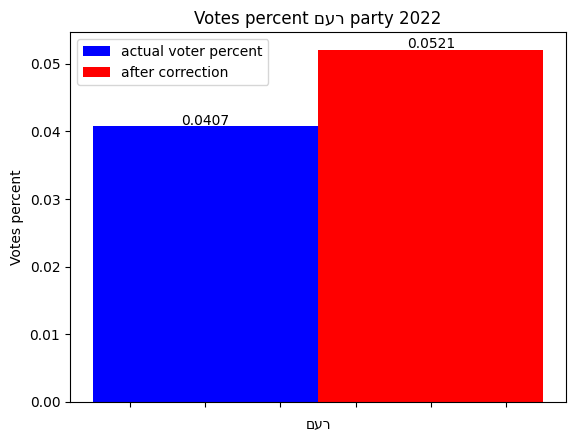

(<Figure size 640x480 with 1 Axes>,
 <AxesSubplot: title={'center': 'Votes percent םער party 2022'}, xlabel='םער', ylabel='Votes percent'>)

In [123]:
def party_bar_fix(df1, df2, thresh):
    width = 0.3  # set column width
    votes = parties_votes_percents(df1, thresh)  # total votes for each party
    votes = votes['רעם']
    n = 1  # number of parties
    names = 'רעם'

    fixed_votes = parties_votes_percents(df2, thresh)
    new_fixed_votes = fixed_votes['רעם']

    rev_names = [name[::-1] for name in list(names)]
    fig, ax = plt.subplots()  # plt.subplots()

    all_bar = ax.bar([1], [votes], width, color='b')
    fix_bar = ax.bar(np.array([1])+width, [new_fixed_votes], width, color='r')

    ax.set_ylabel('Votes percent')
    ax.set_xlabel('םער')
    ax.set_title('Votes percent םער party 2022')
    ax.legend((all_bar[0], fix_bar[0]), ('actual voter percent', 'after correction'), loc='best')
    x=[all_bar[0], fix_bar[0]]
    ax.set_xticklabels('')
    for bar in x:
      ax.annotate(format(bar.get_height(), '.4f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 4),
                   textcoords='offset points')
    plt.show()
    return fig, ax

party_bar_fix(df_2022_ballots, df_fix, 0.035)

In [25]:
url = 'https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes%20per%20ballot%202021%20-%20votes%20per%20ballot%202021.csv'
df_2021_ballots_raw = pd.read_csv(url, index_col='שם ישוב')
df_2021_ballots_raw.rename(columns=parties_dict_2021, inplace=True)
df_2021_ballots_raw = df_2021_ballots_raw[df_2021_ballots_raw.columns[:-1]]
df_2021_ballots = df_2021_ballots_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
df_2021_ballots = df_2021_ballots[df_2021_ballots.columns[9:]] # removing "metadata" columns


In [26]:
v = df_2021_ballots_raw['כשרים'].div(df_2021_ballots_raw['בזב'])
df_fix_b = df_2021_ballots.div(v, axis = "rows")

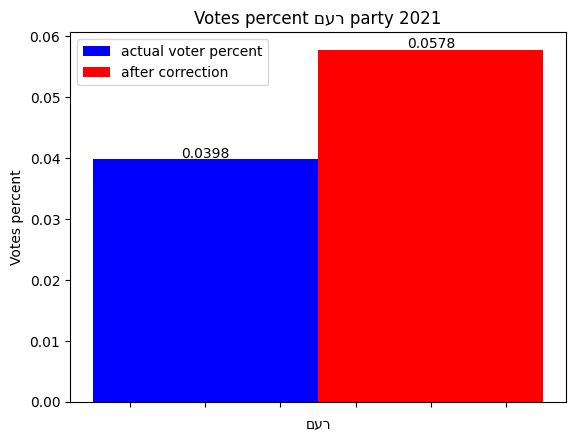

(<Figure size 640x480 with 1 Axes>,
 <AxesSubplot: title={'center': 'Votes percent םער party 2021'}, xlabel='םער', ylabel='Votes percent'>)

In [27]:
def party_bar_fix(df1, df2, thresh):
    width = 0.3  # set column width
    votes = parties_votes_percents(df1, thresh)  # total votes for each party
    votes = votes['רעם']
    n = 1  # number of parties
    names = 'רעם'

    fixed_votes = parties_votes_percents(df2, thresh)
    new_fixed_votes = fixed_votes['רעם']

    rev_names = [name[::-1] for name in list(names)]
    fig, ax = plt.subplots()  # plt.subplots()

    all_bar = ax.bar([1], [votes], width, color='b')
    fix_bar = ax.bar(np.array([1])+width, [new_fixed_votes], width, color='r')

    ax.set_ylabel('Votes percent')
    ax.set_xlabel('םער')
    ax.set_title('Votes percent םער party 2021')
    ax.legend((all_bar[0], fix_bar[0]), ('actual voter percent', 'after correction'), loc='best')
    x=[all_bar[0], fix_bar[0]]
    # ax.set_xticks(np.arange(n))
    ax.set_xticklabels('')
    for bar in x:
      ax.annotate(format(bar.get_height(), '.4f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 4),
                   textcoords='offset points')
    plt.show()
    return fig, ax
party_bar_fix(df_2021_ballots, df_fix_b, 0.035)

<font size="4">
From the observation between the actual voting percentages and the potential voting percentages (after correction) it can be seen that in both the 21st and 22nd elections,
The actual voting rate of the Ream Party is lower than the party's potential supporters.

Therefore, the party should and can concentrate its efforts in trying to "bite" a little into this gap and enter the vacuum.
</font>

In [28]:
cor_22 = parties_votes_percents(df_fix, 0.035)  # total votes for each party
cor_22 = cor_22['רעם']

cor_21 = parties_votes_percents(df_fix_b, 0.035)  # total votes for each party
cor_21 = cor_21['רעם']

nor_22 = parties_votes_percents(df_2022_ballots, 0.035)
nor_22 = nor_22['רעם']

nor_21 = parties_votes_percents(df_2021_ballots, 0.035)
nor_21 = nor_21['רעם']

total_22  = df_2022_ballots_raw['מצביעים'].sum() / df_2022_ballots_raw['בזב'].sum()
total_21  = df_2021_ballots_raw['מצביעים'].sum() / df_2021_ballots_raw['בזב'].sum()

ram_22 = nor_22/cor_22
ram_21 = nor_21/cor_21


<font size="3">
Now, we will compare the actual voting rate to the party from the potential voting rate (the blue bar),
and the general voter turnout in the State of Israel in that election year.
</font>

In [29]:
data = {'רעם': ['voting rate רעם', 'general voting rate'], 'Value': [ram_22, total_22]}
df = pd.DataFrame(data)

fig = px.bar(df, x='רעם', y='Value',
             title='Comparison between the voting rate in the רעם party and the general voting rate in 2022 election' ,
             color  = 'רעם',
             text = 'Value',
             labels={'x':'Usage Type', 'y':'Value'})
fig.show()


In [30]:
data = {'רעם': ['voting rate רעם', 'general voting rate'], 'Value': [ram_21, total_21]}
df = pd.DataFrame(data)

fig = px.bar(df, x='רעם', y='Value',
             title='Comparison between the voting rate in the רעם party and the general voting rate in 2021 election' ,
             color  = 'רעם',
             text = 'Value',
             labels={'x':'Usage Type', 'y':'Value'})
fig.show()

<font size="4">
It is easy to notice that although the voting percentages for the party are higher than the general voting percentages, an increase in the percentage of general voters in the country may benefit the party.

This is because the party still has much room to grow from the potential (more than 20%).
</font>

# <h1><center> Part 4 - Economic & geographic analysis </center></h1>

<font size="4">
In this section we will present how the frequency of voting and the absolute amount of voting for the רעם party varies between different localities and polling stations.

In addition, we will demonstrate analyzes in comparison to the other Arab parties in Israeli politics and we will demonstrate this through the support from among cities characterized as Jewish.

Finally, we will refer to the economic-social analysis and we will see the segmentation of the frequency of voting for the רעם party in the division into social economic clusters and we will try to diagnose a relationship between the percentage of voters for the party from a certain locality and the Gini index for inequality.
</font>


In [31]:
df_eco = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/eshkol_hevrati_calcali.csv")
df_city_22 = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes_22.csv")
parties_dict_2022 = { 'מחל':'ליכוד', 'פה':'יש עתיד', 'שס':'שס', 'כן':'המחנה הממלכתי', 'ב':'הבית היהודי', 'אמת':'עבודה', 'ג':'יהדות התורה', 'ל':'ישראל ביתנו', 'ט':'ציונות דתית',
                      'ום':'חדש תעל', 'מרצ':'מרצ', 'עם':'רעם', 'ד' : 'בלד', 'קלפי' : "קלפי" , 'שם ישוב':"שם ישוב" }
df_city_22.rename(columns=parties_dict_2022, inplace=True)
df_city_22 = df_city_22[df_city_22['שם ישוב'] != "מעטפות חיצוניות"]
#df_city_22 = df_city_22[[name for name in df_city_22.columns if name in parties_dict_2022.values()]]

In [32]:
selected_columns = df_city_22[['רעם','שם ישוב']]
sorted_columns = selected_columns.sort_values(by=['רעם'], ascending=False)

In [33]:
top_12_cities = sorted_columns.head(12)

fig = px.bar(top_12_cities, x='שם ישוב', y='רעם',
             title='The 12 cities with the highest (absolute) number of votes for the רעם party, 2022' ,
             color  = 'שם ישוב',
             text = 'רעם',
             labels={'x':'City Name', 'y':'Votes'})
fig.show()

<font size="4">
Here we present a general picture of the segmentation of the absolute amount of votes for the רעם party across the dozen settlements with the highest amount.

It is understood that this is a rather simplistic analysis, but in our opinion it was important to start from it in order to illustrate which localities have the highest absolute number of support for the party in order to show its centers of power in a quantitative - absolute sense.
</font>

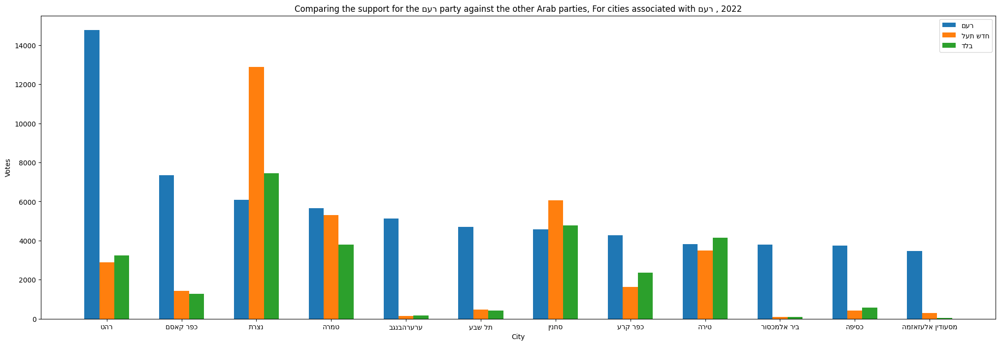

In [34]:
data = pd.DataFrame(df_city_22[['רעם','חדש תעל','בלד','שם ישוב']])
sorted_columns = data.sort_values(by=['רעם'], ascending=False)
top_12_cities = sorted_columns.head(12)
top_12_cities = top_12_cities.transpose()


city_names = list(top_12_cities.iloc[3])
top_12 = top_12_cities.iloc[[0,1,2]]
party_names = list(top_12.index)
plt.figure(figsize = (25,8))

N = 12
ind =np.arange(12)
width = 0.2

for i in range(3):
  plt.bar(ind + width*i , top_12.iloc[i], width, label = party_names[i][::-1])




plt.xticks(ind+width, [city_names[i][::-1] for i in range(len(city_names))])
plt.xlabel("City")
plt.ylabel("Votes")
plt.title("Comparing the support for the םער party against the other Arab parties, For cities associated with םער , 2022")
plt.legend()
plt.show()

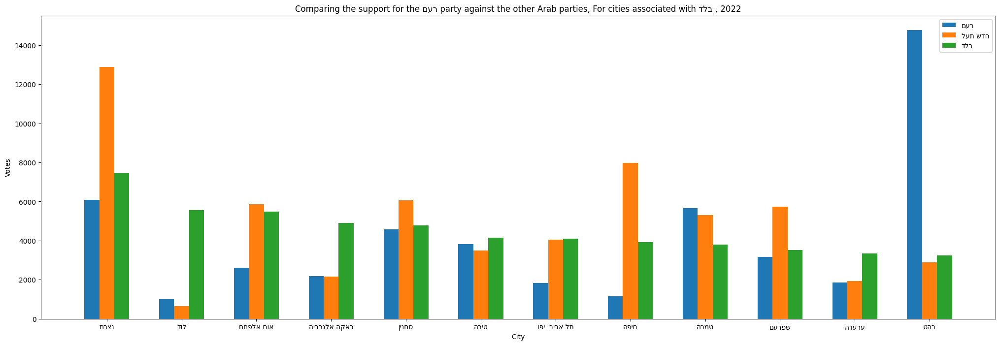

In [35]:
data = pd.DataFrame(df_city_22[['רעם','חדש תעל','בלד','שם ישוב']])
sorted_columns = data.sort_values(by=['בלד'], ascending=False)
top_12_cities = sorted_columns.head(12)
top_12_cities = top_12_cities.transpose()


city_names = list(top_12_cities.iloc[3])
top_12 = top_12_cities.iloc[[0,1,2]]
party_names = list(top_12.index)
plt.figure(figsize = (25,8))

N = 12
ind =np.arange(12)
width = 0.2

for i in range(3):
  plt.bar(ind + width*i , top_12.iloc[i], width, label = party_names[i][::-1])




plt.xticks(ind+width, [city_names[i][::-1] for i in range(len(city_names))])
plt.xlabel("City")
plt.ylabel("Votes")
plt.title("Comparing the support for the םער party against the other Arab parties, For cities associated with דלב , 2022")
plt.legend()
plt.show()

<font size="4">
In the last two charts, we made a comparison between the amount of voting for the רעם party and the amount of voting for the other Arab parties in Israeli politics, בלד, חדש תעל.
Where the first bar plot shows the amounts of votes for the various parties among cities identified with Ream, while the second shows the amounts among cities identified with the בלד party.


Clearly, it is possible to distinguish the significant differences in the support received by the Ream party among smaller cities that are homogeneous in their religion and affiliation.
This is in contrast to more "developed", mixed, and large cities, where the other parties receive significantly wider support.

Our message for רעם in this case is -
At the same time as maintaining power in the small and homogenous localities, you must invest in advocacy and communication efforts in the mixed and larger cities in order to expand your support camp and "bite" into the audience of voters from the Arab sector who currently vote for other parties
</font>

In [36]:
city_per = df_city_22.copy()
for i in range(len(city_per)):
  city_per.iloc[i,7:] = city_per.iloc[i,7:]/city_per.iloc[i][6]

In [37]:
selected_columns_city = city_per[['רעם','שם ישוב']]
sorted_columns_city = selected_columns_city.sort_values(by=['רעם'], ascending=False)

In [38]:
top_12_cities_per = sorted_columns_city.head(12)

fig = px.bar(top_12_cities_per, x='שם ישוב', y='רעם',
             title='The 12 cities with the highest percent of votes for the רעם party, 2022' ,
             color  = 'שם ישוב',
             labels={'x':'City Name', 'y':'Votes'})
fig.show()

<font size="4">
Looking at the dozen localities with the highest relative frequency of voting for the רעם party, it is evident that most of them are very small localities that belong to the Bedouin population.
Therefore, we will analyze the probability of voting for the רעם party only among cities with over 20,000 inhabitants
</font>

In [39]:
city_per = df_city_22.copy()
city_per = city_per[city_per['בזב']> 20000] # only Cities
for i in range(len(city_per)):
  city_per.iloc[i,7:] = city_per.iloc[i,7:]/city_per.iloc[i][6]

In [40]:
selected_columns_city = city_per[['רעם','שם ישוב']]
sorted_columns_city = selected_columns_city.sort_values(by=['רעם'], ascending=False)

In [41]:
top_12_cities_per = sorted_columns_city.head(12)

fig = px.bar(top_12_cities_per, x='שם ישוב', y='רעם',
             title='The 12 cities with the highest percent of votes for the רעם party, Only cities over 20,000 inhabitants,  2022 ' ,
             color  = 'שם ישוב',
             labels={'x':'City Name', 'y':'Votes'})
fig.show()

<font size="4">
Analyzing the frequency of voting for the רעם party only among cities with over 20,000 inhabitants, it is evident that all the dozen cities with the highest frequency are Arab or mixed cities.

Although in some of them the rate of relative prevalence is not low, it is evident that the party has quite a bit of room to grow into it and increase the rate of support in these localities, certainly based on the previous analyzes that we presented in front of the other Arab parties.
</font>

In [42]:
yeshuvim_bycode = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/cities_extra_data.csv")
yeshuvim_bycode.columns = ['סמל ישוב' if x=='סמל יישוב' else x for x in yeshuvim_bycode.columns]
df_city_all_22 = city_per.merge(yeshuvim_bycode, on='סמל ישוב')

In [43]:
selected_columns = df_city_all_22[['רעם','שם ישוב','דת יישוב']]
filtered_df = selected_columns[selected_columns['דת יישוב'] == 1] # Filtering Jewish cities


filtered_df = filtered_df.sort_values(by=['רעם'], ascending=False)

In [44]:
top_12_cities = filtered_df.head(12)

fig = px.bar(top_12_cities, x='שם ישוב', y='רעם',
             title='The 12 Jewish cities with the highest percentage of votes for the רעם party, 2022' ,
             color  = 'שם ישוב',
             labels={'x':'City Name', 'y':'Votes'})
fig.show()

<font size="4">
It is not difficult to notice that the רעם party did not gain wide support among Jewish cities.
The reason for this, of course, lies in the Islamic ideology of the party.

However, we must not ignore the fact that there is some support base for the party, which needs to be developed and expanded with different and adapted tools.
</font>

In [45]:
selected_columns = df_city_all_22[['רעם','שם ישוב','דת יישוב','בלד','חדש תעל']]
filtered_df = selected_columns[selected_columns['דת יישוב'] == 1]
filtered_df = filtered_df[['רעם','חדש תעל','בלד','שם ישוב']]

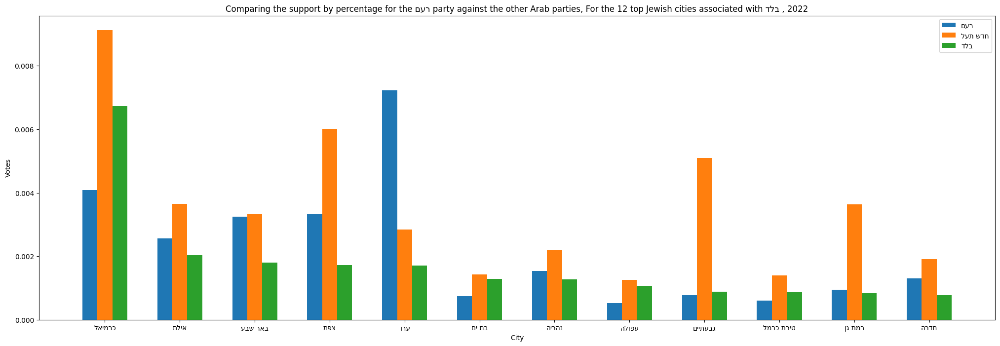

In [46]:
data = pd.DataFrame(filtered_df)
sorted_columns = data.sort_values(by=['בלד'], ascending=False)
top_12_cities = sorted_columns.head(12)
top_12_cities = top_12_cities.transpose()


city_names = list(top_12_cities.iloc[3])
top_12 = top_12_cities.iloc[[0,1,2]]
party_names = list(top_12.index)
plt.figure(figsize = (25,8))

N = 12
ind =np.arange(12)
width = 0.2

for i in range(3):
  plt.bar(ind + width*i , top_12.iloc[i], width, label = party_names[i][::-1])




plt.xticks(ind+width, [city_names[i][::-1] for i in range(len(city_names))])
plt.xlabel("City")
plt.ylabel("Votes")
plt.title("Comparing the support by percentage for the םער party against the other Arab parties, For the 12 top Jewish cities associated with דלב , 2022")
plt.legend()
plt.show()

<font size="4">
Comparing the frequency of voting between the Arab parties, רעם's weakness in attracting voters from Jewish communities, compared to the other Arab parties, is reflected.
Along with the negative insight, there also lies an opportunity.
There is a potential electorate in the Jewish communities that may switch to רעם.

Also, it can be noticed that while the percentage of support for רעם is relatively high in the Jewish peripheral cities (north and south), in the larger central cities such as Ramat Gan and Givatayim, רעם is pushed to the margins.
</font>

In [47]:
df_eco.columns = ['סמל ישוב' if x=='set_code' else x for x in df_eco.columns]
df_eco = df_eco.merge(df_city_22, on='סמל ישוב')

In [48]:
selected_columns = df_eco[['רעם','eco_level']]
df_cluster = selected_columns.groupby('eco_level').sum()
df_cluster['רעם'] = df_cluster['רעם']/df_cluster['רעם'].sum()
df_cluster = df_cluster.assign(eco_level=range(1,11))


fig = px.bar(df_cluster, x='eco_level', y='רעם',
             title='The frequency of voting for the רעם party by social economic cluster, 2022' ,
             color  = 'eco_level',
             labels={'eco_level':'Economic level', 'רעם':'Voting frequency'})
fig.show()


<font size="4">
In a certain analogy to the insights from the analysis of the frequency of voting for Raam among the Jewish cities (the previous one), also from the analysis of the frequency of voting for the party according to socio-economic cluster, it can be seen that the percentages of support for Raam reside mainly among voters of low to medium socioeconomic status.
</font>

In [49]:
gini = pd.read_csv('https://raw.githubusercontent.com/galsalo/statistics_labs/main/Gini.csv', encoding = "ISO-8859-8")
gini.columns = ['שם ישוב' if x=='רשות מקומית' else x for x in gini.columns]
city_per = df_city_22.copy()
for i in range(len(city_per)):
  city_per.iloc[i,7:] = city_per.iloc[i,7:]/city_per.iloc[i][6]


In [50]:
gini = gini.merge(city_per, on='שם ישוב')
gini_ram = gini[['רעם',"מדד ג'יני[2]"]]
gini_ram.columns = ['Gini_Index' if x=="מדד ג'יני[2]" else x for x in gini_ram.columns]
gini_ram.columns = ['votes' if x=="רעם" else x for x in gini_ram.columns]

In [51]:
fig = px.scatter(gini_ram, x="Gini_Index", y='votes', title = 'Diagnosing the relationship between the Gini index in the settlement and the percentage of votes for the רעם party',
                 labels={'Gini_Index':'Gini Index', 'votes':'Votes Percentage'})
fig.show()

<font size="4">
Most of the voters of the Raam party come from cities with a medium-low Gini index. That is, from settlements characterized by relatively low inequality.
This is not a real surprise since the current analysis, similar to the insight from the previous graph: most Ream voters are associated with the low socio-economic status, from the socio-economic periphery in Israel and therefore their localities are characterized by a relatively egalitarian distribution of income since it is relatively low among all.
</font>

# <h1><center> Part 5 - PCA analysis </center></h1>
<font size="4">
In this part, we will present the voting data from the 2022 elections by visualizing them through the two primary components in a PCA analysis. PCA analysis allows us to show the differences between the different ballots in a simple two-dimensional manner, while maximizing the differences between any two ballots, so that the farther two points are on the graph, the more different the nature of voters in them are.

We can interpret the primary components in the following manner:

- PCA1: High values (on the right side) indicate a more conservative ideology on the political map, and vice versa.
- PCA2: High values (upwards) indicate a Jewish nationality and low values indicate an Arab nationality.
</font>

In [52]:
ballot_22_source = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes_22_ballot.csv")
ballot_21_source = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes%20per%20ballot%202021%20-%20votes%20per%20ballot%202021.csv")

In [53]:
ballot_22_source = ballot_22_source[ballot_22_source['סמל ישוב']!=9999].reset_index()   # removes the external votes
ballot_21_source = ballot_21_source[ballot_21_source['סמל ישוב']!=9999].reset_index()   # removes the external votes
ballot_22_source.drop(columns='index', inplace=True)
ballot_21_source.drop(columns='index', inplace=True)

In [54]:
names = {'מחל':'ליכוד'
    ,'פה':'יש עתיד'
    ,'שס':'שס'
    ,'כן':'המחנה הממלכתי'
    ,'ב':'ימינה'
    ,'אמת':'העבודה'
    ,'ג':'יהדות התורה'
    ,'ל':'ישראל ביתנו'
    ,'ט':'ציונות דתית'
    ,'ום':'חד״ש תע״ל'
    ,'ד':'בלד'
    ,'עם':'רעם'
    ,'רק':'דמוקרטית'
    ,'רף':'עם שלם'
    ,'רנ':'התקווה לשינוי'
    ,'ר':'רפא'
    ,'קץ':'משפט צדק'
    ,'קך':'סדר חדש'
    ,'קי':'שמע'
    ,'ק':'הבלתי אפשרי, אפשרי'
    ,'ץ':'דעם'
    ,'צף':'חץ'
    ,'צכ':'מען (יחד) לעידן חדש'
    ,'צי':'עצמנו עצמאים וליברלים'
    ,'ףז':'הפיראטים'
    ,'נר':'אנחנו'
    ,'ני':'עולם חדש'
    ,'נ':'קידום מעמד הפרט'
    ,'כך':'אני ואתה'
    ,'כ':'הלב היהודי'
    ,'יר':'מנהיגות חברתית'
    ,'יק':'הגוש התנכ״י'
    ,'יף':'כבוד האדם'
    ,'ינ':'ברית השותפות לאיחוד לאומי'
    ,'י':'המפץ החברתי - גימלאים'
    ,'זץ':'צומת - עצמאים, חקלאים, כפרים'
    ,'ז':'הישראלים'
    ,'יז':'הכלכלית'
    }
ballot_22_source.rename(columns=names, inplace=True)

In [55]:
ballot_22 = ballot_22_source.iloc[:, 11:]      # remove the first 11 columns

In [56]:
ballot_22 = ballot_22.div(ballot_22.sum(axis=1), axis=0)        # normalizing the votes for each party

In [57]:
pca = PCA(n_components=2)   # create a PCA object
pca.fit(ballot_22)    # fit the PCA object to the data
pca_df = pd.DataFrame(pca.transform(ballot_22), columns=['PC1', 'PC2'])   # transform the data to 2D
pca_df = pca_df.fillna(0)   # fill the NaN values with 0 for easier plotting
# pca_df[['PC1', 'PC2']] = normalize(pca_df[['PC1', 'PC2']], axis=0)
pca_df['Voting frequency'] = ballot_22.loc[:,'רעם']
pca_df['city'] = ballot_22_source['שם ישוב']
fig = px.scatter(pca_df, x='PC1', y='PC2', color='Voting frequency', opacity=0.5, title="Raam voting frequency PCA analysis", hover_name='city')
# fig.update_layout(autosize=False, width=700, height=500,)
fig.show()

<font size="4">
It can be inferred that most of the votes that the party receives come from Arab villages that are more conservative in their stance, and from mixed villages with a lot of residents, and there are few votes from areas where the nation is more Jewish and conservative.
</font>

<font size="4">
Now we will present the ballots in a similar way, but this time we will mark with color the percentage of votes that the party lost or gained from the 2021 elections
</font>

In [58]:
ballot_21_source.rename(columns=names, inplace=True)

In [59]:
# ballot 2022
ballot_22_freq = ballot_22_source.iloc[:, 11:] # remove the first 11 columns
ballot_22_freq = ballot_22_freq.div(ballot_22_freq.sum(axis=1), axis=0)     # calculate the relative voting frequency
ballot_22_freq['city'] = ballot_22_source.loc[:,'סמל ישוב']     # add city number column
ballot_22_freq['ballot'] = ballot_22_source.loc[:,'קלפי']        # add ballot number column

# ballot 2021
ballot_21_freq = ballot_21_source.iloc[:, 11:] # remove the first 11 columns
ballot_21_freq = ballot_21_freq.div(ballot_21_freq.sum(axis=1), axis=0)     # calculate the relative voting frequency
ballot_21_freq['city'] = ballot_21_source.loc[:,'סמל ישוב']     # add city number column
ballot_21_freq['ballot'] = ballot_21_source.loc[:,'קלפי']        # add ballot number column

In [60]:
ballot_22_freq.drop(columns=[col for col in list(ballot_22_freq.columns) if col not in ['רעם','city','ballot']], inplace=True)       # drops all columns except ['רעם','city','ballot']
ballot_21_freq.drop(columns=[col for col in list(ballot_21_freq.columns) if col not in ['רעם','city','ballot']], inplace=True)

In [61]:
raam_diff = ballot_22_freq.merge(ballot_21_freq, on=['city', 'ballot'], how='left', suffixes=('_2022', '_2021'))        # merge on left to keep all rows in ballot_22_freq

In [62]:
raam_diff['diff'] = raam_diff.loc[:,'רעם_2022'].sub(raam_diff.loc[:,'רעם_2021'])
raam_diff['diff'].fillna(0, inplace=True)

In [63]:
pca_df['Voting difference'] = raam_diff['diff']
pca_df['Voters'] = ballot_22_source['בזב']
pca_df['Voting difference'].fillna(0, inplace=True)
pca_df['Difference class'] = pd.cut(pca_df['Voting difference'], bins=[min(pca_df['Voting difference']), -0.2, -0.00001, 0.00001, 0.2, max(pca_df['Voting difference'])] ,labels=["High loss", "Medium loss", "No votes","Medium gain" ,"High gain"])

pca_df['abs_voting_diff'] = abs(pca_df['Voting difference'])

fig = px.scatter(pca_df.sort_values(by='abs_voting_diff'), x='PC1', y='PC2',
                 color='Difference class',
                 opacity=0.5,
                 title="Raam voting frequency difference PCA analysis",
                 hover_data=['Voters','Voting difference'], hover_name='city', color_discrete_map={ "High loss":"red", "Medium loss":"#ff7f0e","No votes":"#7f7f7f", "Medium gain":"lightgreen", "High gain":"darkgreen"})
fig.show()

<font size="4">
In the graph, it is possible to see the percentage of votes that the party lost in each ballot. The points marked in red represent the highest percentage of vote loss, and the points marked in pale green represent the ballots in which the number of votes increased by a high percentage.

It can be inferred that in the lower-right area of the graph, the party relatively gained more votes in areas considered more conservative ideologically and lost votes in more moderate areas. Additionally, the following mentioned villages, at least 25% of the votes were lost in at least one ballot compared to the previous year, and therefore it is recommended to focus on them in the next campaign: 'דייר חנא' 'לוד' 'מגאר' 'משהד' 'סחנין' 'עטאוונה שבט' 'רמלה'.
</font>

<font size="4">
Principal Component Analysis (PCA) is a method used to simplify and visualize high-dimensional data. In this case, it was used to analyze voting data from the 2022 elections and present the results in a two-dimensional graph.

 The advantage of PCA is its ability to effectively reduce the dimensionality of complex data while preserving its most important features, making it easy to visualize and understand. However, one disadvantage is that it can be sensitive to outliers and may not always produce the most accurate results. Alternative methods for data visualization and analysis include t-SNE, MDS, and LLE. The results obtained from PCA analysis are considered credible wheb the data is preprocessed and cleaned properly and the assumptions of the PCA are met.
</font>

In [64]:
high_potential = list(raam_diff[raam_diff['diff']<-0.25].loc[:,'city'])
high_potential = ballot_22_source[ballot_22_source['סמל ישוב'].isin(high_potential)].loc[:,'שם ישוב'].unique()

# <h1><center> Parts 6,7 - Votes transfers </h1></center>

In [65]:
# Read two elections data (by cities):
data_type = "ballot"  # city
#Rename Parties
parties_dict_2021 ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "ימינה"
     , 'ט'  : "הציונות הדתית",'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "כחול לבן", 'שס'  : "שס"}
parties_dict_2022 ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "הבית היהודי", 'ט'  : "הציונות הדתית",
 'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "המחנה הממלכתי", 'שס'  : "שס", 'ום':'חדש-תעל','ד':'בלד'}

df_2021_raw = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes%20per%20ballot%202021%20-%20votes%20per%20ballot%202021.csv", index_col='שם ישוב')
df_2022_raw = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes_22_ballot.csv", index_col='שם ישוב')

# preprocessing of ballot
# convert columns with the parties' names
df_2021_raw.rename(columns=parties_dict_2021, inplace=True)
df_2021_raw = df_2021_raw.drop('מעטפות חיצוניות', axis=0)

# preprocessing of cities
df_2021 = df_2021_raw
df_2021 = df_2021[df_2021.columns[10:-1]] # removing "metadata" columns
# Dataset is now stored in a Pandas Dataframe

df_2022_raw = df_2022_raw.drop('מעטפות חיצוניות', axis=0)
df_2022_raw.rename(columns=parties_dict_2022, inplace=True)
df_2022 = df_2022_raw[df_2022_raw.columns[10:-1]] # removing "metadata" columns

# Dataset is now stored in a Pandas Dataframe

In [66]:
# Compute votes share only for parties above a certain threshold
def parties_votes_percents(df, thresh):
    par = df.sum().div(df.sum().sum()).sort_values(ascending=False)
    return par[par > thresh]

total_votes_22 = parties_votes_percents(df_2022, -0.1)  # total votes for each party
names_13_22 = total_votes_22.keys()[:13] # 13 parties
# print(names_13_22)

total_votes_21 = parties_votes_percents(df_2021, -0.1)  # total votes for each party
names_13_21 = total_votes_21.keys()[:13] # 13 parties
# print(names_13_21)


#Rearange:
names_13_22 = ['הליכוד', 'יש עתיד','שס',  'המחנה הממלכתי',
       'יהדות התורה', 'עבודה','הבית היהודי','ישראל ביתנו', 'רעם','בלד','הציונות הדתית', 'חדש-תעל',  'מרצ']

names_13_21 = ['הליכוד', 'יש עתיד', 'שס', 'כחול לבן', 'יהדות התורה', 'עבודה', 'ימינה',
       'ישראל ביתנו', 'הרשימה המשותפת', 'הציונות הדתית', 'תקוה חדשה', 'מרצ',
       'רעם']

In [126]:
cols_21=np.copy(names_13_21).tolist()
cols_21.extend(['בזב','כשרים','קלפי' ,'סמל ישוב'])

cols_22=np.copy(names_13_22).tolist()
cols_22.extend(['בזב','כשרים','קלפי' ,'סמל ישוב'])

df_2021_ballot = df_2021_raw[cols_21].reset_index()
df_2022_ballot = df_2022_raw[cols_22].reset_index()

ballot_match = df_2021_ballot.set_index(['שם ישוב','קלפי', 'סמל ישוב']).join(df_2022_ballot.set_index(['שם ישוב','קלפי', 'סמל ישוב']), lsuffix = '-2021').dropna()

ballot_2022 = ballot_match[ballot_match.columns[15:]]
ballot_2021 = ballot_match[ballot_match.columns[0:15]]

cols_21=np.copy(names_13_21).tolist()
cols_21.extend(['בזב','כשרים'])

ballot_2021.columns = cols_21

In [127]:
ballot_2021['לא הצביעו'] = ballot_2021['בזב'] - ballot_2021['כשרים']
ballot_2022['לא הצביעו'] = ballot_2022['בזב'] - ballot_2022['כשרים']

names_13_21_nv = np.copy(names_13_21).tolist()
names_13_21_nv.extend(['לא הצביעו'])

names_13_22_nv = np.copy(names_13_22).tolist()
names_13_22_nv.extend(['לא הצביעו'])

#creating matrix of votes
n_a_nv = ballot_2021[names_13_21_nv].values
n_b_nv = ballot_2022[names_13_22_nv].values

# Calculating M
M_nv_a = np.linalg.pinv(n_a_nv.T @ n_a_nv) @n_a_nv.T @ n_b_nv
M_nv = pd.DataFrame(np.where(M_nv_a < 0.005, 0, M_nv_a))
M_nv = M_nv.div(M_nv.sum(axis = 1), 0)

In [128]:
def corr_heat_map(M, parties_2022, parties_2021):
    n_22 = len(parties_2022)
    n_21 = len(parties_2021)

    fig, ax = plt.subplots(figsize = (13,13))
    im = ax.imshow(M, cmap=plt.get_cmap('viridis'))

    ax.set_title("changes in voting preferences - M")
    ax.set_xticks(np.arange(n_22))
    ax.set_yticks(np.arange(n_21))
    # And to label them with the relevant parties names
    ax.set_xticklabels([n[::-1] for n in parties_2022], rotation=90)
    ax.set_yticklabels([n[::-1] for n in parties_2021])
    ax.set_xlabel("2022")
    ax.set_ylabel("2021")

    # Loop over data dimensions to create text annotations.
    for i in range(n_21):
        for j in range(n_22):
            text = ax.text(j, i, round(M[i, j], 3), ha="center", va="center", color="w")

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('votes probability', rotation=-90, va="bottom")

    plt.show()

In [129]:
def normalizing_M (M_n):
  M_n[M_n < 0.005] = 0
  temp = 0
  for i in range(len(M_n)):
    for j in range(len(M_n.columns)):
      temp = temp + M_n.iloc[i][j]
    M_n.iloc[i] = M_n.iloc[i]/temp
    temp = 0
  return(M_n)


In [130]:
votes_22_b = pd.read_csv('https://raw.githubusercontent.com/galsalo/statistics_labs/main/election%2022%20by%20kalpi.csv')
votes_21_b = pd.read_csv('https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes%20per%20ballot%202021%20-%20votes%20per%20ballot%202021.csv')

parties_dict_2022_b = { 'מחל':'ליכוד', 'פה':'יש עתיד', 'שס':'שס', 'כן':'המחנה הממלכתי', 'ב':'הבית היהודי', 'אמת':'עבודה', 'ג':'יהדות התורה', 'ל':'ישראל ביתנו', 'ט':'ציונות דתית',
                      'ום':'חדש תעל', 'מרצ':'מרצ', 'עם':'רעם', 'ד' : 'בלד', 'קלפי' : "קלפי" , 'שם ישוב':"שם ישוב",
                       'בזב': 'בזב', 'מצביעים':'מצביעים'}
votes_22_b.rename(columns=parties_dict_2022_b, inplace=True)
votes_22_b = votes_22_b[votes_22_b['שם ישוב'] != "מעטפות חיצוניות"]
votes_22_b = votes_22_b[[name for name in votes_22_b.columns if name in parties_dict_2022_b.values()]]

parties_dict_2021_b ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "ימינה"
     , 'ט'  : "הציונות הדתית",'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "כחול לבן", 'שס'  : "שס" , 'שם ישוב' : "שם ישוב" , 'קלפי' : "קלפי",
     'בזב': 'בזב', 'מצביעים':'מצביעים'}

votes_21_b.rename(columns=parties_dict_2021_b, inplace=True)
votes_21_b = votes_21_b[votes_21_b['שם ישוב'] != "מעטפות חיצוניות"]
votes_21_b = votes_21_b[[name for name in votes_21_b.columns if name in parties_dict_2021_b.values()]]

In [131]:
df_22_b = votes_22_b.copy()
votes_22_b = votes_22_b.set_index(['קלפי','שם ישוב']).add_prefix("22_").reset_index()

df_21_b = votes_21_b.copy()
votes_21_b = votes_21_b.set_index(['קלפי','שם ישוב']).add_prefix("21_").reset_index()

# And merging on 'סמל ישוב' and 'קלפי':
merged_b = votes_22_b.merge(votes_21_b, on=['קלפי','שם ישוב'], suffixes=('',''))
# merged_b.columns

In [132]:
N_a = merged_b.loc[:,merged_b.columns.str.contains('21')]
N_b = merged_b.loc[:,merged_b.columns.str.contains('22')]

In [133]:
N_a['21_לא הצביעו'] = N_a['21_בזב'] - N_a['21_מצביעים']

N_a = N_a.drop(columns=['21_בזב',
                            '21_מצביעים'])

N_b['22_לא הצביעו'] = N_b['22_בזב'] - N_b['22_מצביעים']

N_b = N_b.drop(columns=['22_בזב',
                            '22_מצביעים'])

In [134]:
M_b = np.dot((np.dot(np.linalg.inv(np.dot(N_a.T,N_a)),N_a.T)),N_b)
M_b = pd.DataFrame(M_b)
#M, residuals, rank, s = np.linalg.lstsq(N_a, N_b, rcond=None)

#renaming the columns and rows
parties_21_b = [x for x in list(N_a.columns)]
parties_22_b = [x for x in list(N_b.columns)]


M_b.columns = parties_22_b
M_b.index = parties_21_b

In [135]:
M_b = normalizing_M(M_b)

In [136]:
# A function to create random argb-format color:

def set_color_2(M,i):
  color_1 = int(np.random.choice(range(256), size=1))
  color_2 = int(np.random.choice(range(256), size=1))
  color_3 = int(np.random.choice(range(256), size=1))
  if M.value[i]==0:
    color = f'rgba{(color_1,color_2,color_3,0)}'
  else:
    color = f'rgba{(color_1,color_2,color_3,0.6)}'
  return(str(color))

In [137]:
# A function to create random argb-format color:

def set_color():
  color_1 = int(np.random.choice(range(256), size=1))
  color_2 = int(np.random.choice(range(256), size=1))
  color_3 = int(np.random.choice(range(256), size=1))
  color = f'rgba{(color_1,color_2,color_3,0.6)}'
  return(str(color))

In [138]:
# A function to create the sankey plot:

def sankey_plot_creator (M):
  M_reset = M.stack().reset_index()                                                                       # Resetting the transition  matrix to indexes
  M_reset.rename(columns={'level_0':'source', 'level_1':'target', 0:'value'}, inplace=True)

  M_reset['color'] = 0
  size = len(M_reset.iloc[:,1].unique())
  for i in range(size):
    M_reset.iloc[size*i:size*(i+1),3] = set_color()                                                       # Assigning different color to each party source

  labels = pd.concat([M_reset.source, M_reset.target]).unique()
  #labels

  labels_indices = {label:index for index, label in enumerate(labels)}                                    # linking the labels and the indexes

  M_reset[["source", "target"]] = M_reset[["source", "target"]].applymap(lambda x: labels_indices[x])

  # adding matching explenation texts to the graph:
  pd.set_option("max_colwidth", 100)
  M_reset['shifts'] = 0
  size = len(M_reset.iloc[:,1].unique())
  for i in range(len(M_reset.iloc[:,1])):
    M_reset.iloc[i,4] = f'{round(M_reset.iloc[i,2],3)} of {labels[M_reset.iloc[i,0]][3:]} voters in 2021 voted for {labels[M_reset.iloc[i,1]][3:]} in 2022'

  # creating the sankey plot itself
  fig = go.Figure(data=[go.Sankey(
      node = dict(
        pad = 20,
        thickness = 20,
        line = dict(color = "black", width = 1.0),
        label = labels,

        # this template will be used to display text when hovering over nodes
        hovertemplate = "%{label} has total %{value:d} instances<extra></extra>"
      ),
      link = dict(
        source = M_reset.source,
        target = M_reset.target,
        value = M_reset.value,
        color = M_reset.color,
        customdata = M_reset['shifts'],

        # this template will be used to display text when hovering over the links
        hovertemplate = "%{customdata}<extra></extra>"
    ))
  ])

  fig.update_layout(title_text="Vote shifts between 2021 election and 20222 election", font_size=13, width=1110, height=750)
  fig.show(render="jpg")

In [139]:
sankey_plot_creator(pd.DataFrame(M_b))

<font size="4">
The plot helps to draw a good estimation for how voters shifted between parties between the election of 2021 and the election held in 2022. An explanation of the estimation method can be found further down.

Each "flow" indicates a pattern of voting between the two elections. Hovering over these flows pop up a text describing the specific change in voting – how much from the voters who voted to party j in 2021 voted to a certain party in the election of 2022.

So the numbers refer to the percentage of voters who share the same pattern of voting – voting to one party X in 2021 and voting to party Y in the election of 2022. If a party managed to keep all voters from elections 2021 in 2022, it will result in a flow equals 100% (1 in the plot).

We omitted every voting trend (a flow in the plot linking between a party in 2021 to a party in 2022) that is smaller than 0.5% - that seemed to be a good threshold as 0.5% out of the total number of 'רעם' voters only sum up to less than 1000 people (out of ~167,000-194,000) in both elections and we want to focus on the main, important trends.

</font>

In [140]:
# A function to create random argb-format color:
def set_color_2(M):
  color_1 = int(np.random.choice(range(256), size=1))
  color_2 = int(np.random.choice(range(256), size=1))
  color_3 = int(np.random.choice(range(256), size=1))
  if M.value[i]==0:
    color = f'rgba{(color_1,color_2,color_3,0)}'
  else:
    color = f'rgba{(color_1,color_2,color_3,0.6)}'
  return(str(color))

<font size="4">
From the bigger plot, depicting all changes in voting patterns for all parties between the two elections (the first graph), we filtered out the other parties and focused on 'רעם', in two different plots.

The first describes how 'רעם' voters in 2021 voted in 2022, in other words – the distribution of 'רעם' voters in 2021. The plot indicates that 89% of 'רעם' voters in 2021 remained 'רעם' voters also in 2022. 8.1% percent of the voters in 2021 have decided to vote to 'בלד' in 2022, and 3.2% voted in 2022 to 'חדש תעל'. In total that accumulates to around 18,900 votes. Besides that, the party didn't lose any votes (that are summing up to a larger number than half percent of the party's voters).
</font>

In [141]:
M_raam_21_to_22 = pd.DataFrame(M_b['21_רעם':'21_רעם'])
M_raam_21_to_22

,22_עבודה,22_הבית היהודי,22_יהדות התורה,22_בלד,22_חדש תעל,22_ציונות דתית,22_המחנה הממלכתי,22_ישראל ביתנו,22_ליכוד,22_מרצ,22_רעם,22_יש עתיד,22_שס,22_לא הצביעו
21_רעם,0.0,0.0,0.0,0.080528,0.031526,0.0,0.0,0.0,0.0,0.0,0.887946,0.0,0.0,0.0


In [142]:
#def sankey_plot_creator (M):
M_reset = M_raam_21_to_22.stack().reset_index()                                                                       # Resetting the transition  matrix to indexes
M_reset.rename(columns={'level_0':'source', 'level_1':'target', 0:'value'}, inplace=True)
#M_reset

In [143]:
M_reset['color'] = 0
#M_reset['color_2']=0
size = len(M_reset.iloc[:,1].unique())
for i in range(size):
  M_reset.iloc[i,3] = set_color_2(M_reset)
  #M_reset.iloc[i,4] = (M_reset.iloc[i,3])[0:-4:1]+')'

#M_reset

In [144]:
labels = pd.concat([M_reset.source, M_reset.target]).unique()
#labels

In [145]:
labels_indices = {label:index for index, label in enumerate(labels)}                                    # linking the labels and the indexes
#labels_indices

In [146]:
M_reset[["source", "target"]] = M_reset[["source", "target"]].applymap(lambda x: labels_indices[x])
#M_reset

In [147]:
# adding matching explenation texts to the graph:
pd.set_option("max_colwidth", 100)
M_reset['shifts'] = 0
size = len(M_reset.iloc[:,1].unique())
for i in range(len(M_reset.iloc[:,1])):
  M_reset.iloc[i,4] = f'{round(M_reset.iloc[i,2],3)} of {labels[M_reset.iloc[i,0]][3:]} voters in 2021 voted for {labels[M_reset.iloc[i,1]][3:]} in 2022'

#M_reset

In [148]:
# creating the sankey plot itself
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 20,
      line = dict(color = "black", width = 1.0),
      label = labels,

      # this template will be used to display text when hovering over nodes
      hovertemplate = "%{label} has total %{value:d} instances<extra></extra>"
    ),
    link = dict(
      source = M_reset.source,
      target = M_reset.target,
      value = M_reset.value +0.06,
      color = M_reset.color,
      customdata = M_reset['shifts'],

      # this template will be used to display text when hovering over the links
      hovertemplate = "%{customdata}<extra></extra>"
  ))
])

fig.update_layout(title_text="How 'רעם' voters in 2021 voted in 2022", font_size=13, width=1110, height=850)
fig.show(render="jpg")

<font size="4">
The second plot describes where 'רעם' voters in 2022 came from (what was the voting distribution of 'רעם' voters in 2022 in the elections of 2021). Besides the unsurprising fact that around 89%  of 'רעם' voters in 2022 are also 'רעם' voters in 2021, 'רעם' were contributed also by former 'מרץ' voters (~7.6%), and by 'תקוה חדשה' (4%) who had merged to 'כחול לבן' but lost many votes in the process to other parties, including 'רעם'. Another significant trend is 3.7% of 'רעם' voters in 2022 did not vote at all in 2021. We know the voting rate went up in this elections from 67.44 to 70.63, it seems that 'רעם' benefited from the situation.  it is important to say that the dissolution of 'הרשימה המשותפת' di not contribute a significant number of new votes to 'רעם".
</font>

In [149]:
M_raam_22_from_21 = pd.DataFrame(M_b['22_רעם'])
#M_raam_22_from_21

In [150]:
#def sankey_plot_creator (M):
M_2 = M_raam_22_from_21.stack().reset_index()                                                                       # Resetting the transition  matrix to indexes
M_2.rename(columns={'level_0':'source', 'level_1':'target', 0:'value'}, inplace=True)
#M_2

In [151]:
# A function to create random argb-format color:
def set_color(M):
  color_1 = int(np.random.choice(range(256), size=1))
  color_2 = int(np.random.choice(range(256), size=1))
  color_3 = int(np.random.choice(range(256), size=1))
  if M.value[i]==0:
    color = f'rgba{(color_1,color_2,color_3,0)}'
  else:
    color = f'rgba{(color_1,color_2,color_3,0.6)}'
  return(str(color))

In [152]:
M_2['color'] = 0
#M_2['color_2']=0
size = len(M_2.target)
for i in range(size):
  M_2.iloc[i,3] = set_color(M_2)
  #M_2.iloc[i,4] = (M_2.iloc[i,3])[0:-4:1]+')'

#M_2

In [153]:
labels_2 = pd.concat([M_2.source, M_2.target]).unique()
#labels_2

In [154]:
labels_indices_2 = {label:index for index, label in enumerate(labels_2)}                                    # linking the labels and the indexes
#labels_indices_2

In [155]:
M_2[["source", "target"]] = M_2[["source", "target"]].applymap(lambda x: labels_indices_2[x])
#M_2

In [156]:
# adding matching explenation texts to the graph:
pd.set_option("max_colwidth", 100)
M_2['shifts'] = 0
size = len(M_2.iloc[:,1].unique())
for i in range(len(M_2.iloc[:,1])):
  M_2.iloc[i,4] = f'{round(M_2.iloc[i,2],3)} of {labels_2[M_2.iloc[i,0]][3:]} voters in 2021 voted for {labels_2[M_2.iloc[i,1]][3:]} in 2022'

#M_2

In [157]:
# creating the sankey plot itself
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 20,
      line = dict(color = "black", width = 1.0),
      label = labels_2,

      # this template will be used to display text when hovering over nodes
      hovertemplate = "%{label} has total %{value:d} instances<extra></extra>"
    ),
    link = dict(
      source = M_2.source,
      target = M_2.target,
      value = M_2.value +0.06,
      color = M_2.color,
      customdata = M_2['shifts'],

      # this template will be used to display text when hovering over the links
      hovertemplate = "%{customdata}<extra></extra>"
  ))
])

fig.update_layout(title_text="Where 'רעם' voters in 2022 come from", font_size=13, width=1110, height=850)
fig.show(render="jpg")

In [158]:
# Read two elections data (by cities):
data_type = "ballot"  # city
#Rename Parties
parties_dict_2021 ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "ימינה"
     , 'ט'  : "הציונות הדתית",'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "כחול לבן", 'שס'  : "שס"}
parties_dict_2022 ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "הבית היהודי", 'ט'  : "הציונות הדתית",
 'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "המחנה הממלכתי", 'שס'  : "שס", 'ום':'חדש-תעל','ד':'בלד'}

df_2021_raw = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes%20per%20ballot%202021%20-%20votes%20per%20ballot%202021.csv", index_col='שם ישוב')
df_2022_raw = pd.read_csv("https://raw.githubusercontent.com/galsalo/statistics_labs/main/votes_22_ballot.csv", index_col='שם ישוב')

# preprocessing of ballot
# convert columns with the parties' names
df_2021_raw.rename(columns=parties_dict_2021, inplace=True)
df_2021_raw = df_2021_raw.drop('מעטפות חיצוניות', axis=0)

# preprocessing of cities
df_2021 = df_2021_raw
df_2021 = df_2021[df_2021.columns[10:-1]] # removing "metadata" columns
# Dataset is now stored in a Pandas Dataframe

df_2022_raw = df_2022_raw.drop('מעטפות חיצוניות', axis=0)
df_2022_raw.rename(columns=parties_dict_2022, inplace=True)
df_2022 = df_2022_raw[df_2022_raw.columns[10:-1]] # removing "metadata" columns

# Dataset is now stored in a Pandas Dataframe

In [159]:
# Compute votes share only for parties above a certain threshold
def parties_votes_percents(df, thresh):
    par = df.sum().div(df.sum().sum()).sort_values(ascending=False)
    return par[par > thresh]

total_votes_22 = parties_votes_percents(df_2022, -0.1)  # total votes for each party
names_13_22 = total_votes_22.keys()[:13] # 13 parties
#print(names_13_22)

total_votes_21 = parties_votes_percents(df_2021, -0.1)  # total votes for each party
names_13_21 = total_votes_21.keys()[:13] # 13 parties
#print(names_13_21)


#Rearange:
names_13_22 = ['הליכוד', 'יש עתיד','שס',  'המחנה הממלכתי',
       'יהדות התורה', 'עבודה','הבית היהודי','ישראל ביתנו', 'רעם','בלד','הציונות הדתית', 'חדש-תעל',  'מרצ']

names_13_21 = ['הליכוד', 'יש עתיד', 'שס', 'כחול לבן', 'יהדות התורה', 'עבודה', 'ימינה',
       'ישראל ביתנו', 'הרשימה המשותפת', 'הציונות הדתית', 'תקוה חדשה', 'מרצ',
       'רעם']

In [160]:
cols_21=np.copy(names_13_21).tolist()
cols_21.extend(['בזב','כשרים','קלפי' ,'סמל ישוב'])

cols_22=np.copy(names_13_22).tolist()
cols_22.extend(['בזב','כשרים','קלפי' ,'סמל ישוב'])

df_2021_ballot = df_2021_raw[cols_21].reset_index()
df_2022_ballot = df_2022_raw[cols_22].reset_index()

ballot_match = df_2021_ballot.set_index(['שם ישוב','קלפי', 'סמל ישוב']).join(df_2022_ballot.set_index(['שם ישוב','קלפי', 'סמל ישוב']), lsuffix = '-2021').dropna()

ballot_2022 = ballot_match[ballot_match.columns[15:]]
ballot_2021 = ballot_match[ballot_match.columns[0:15]]

cols_21=np.copy(names_13_21).tolist()
cols_21.extend(['בזב','כשרים'])

ballot_2021.columns = cols_21

In [161]:
n_a = ballot_2021[names_13_21].values
n_b = ballot_2022[names_13_22].values

# Calculating M
M = np.linalg.pinv(n_a.T @ n_a) @n_a.T @ n_b
M_norm =  normalizing_M (pd.DataFrame(M))

<font size="4">
The results these plots rely on are shown in this heat-map, which describes the estimated votes transfer from parties in 2021 election (rows) to parties in 2022 election (columns):
</font>

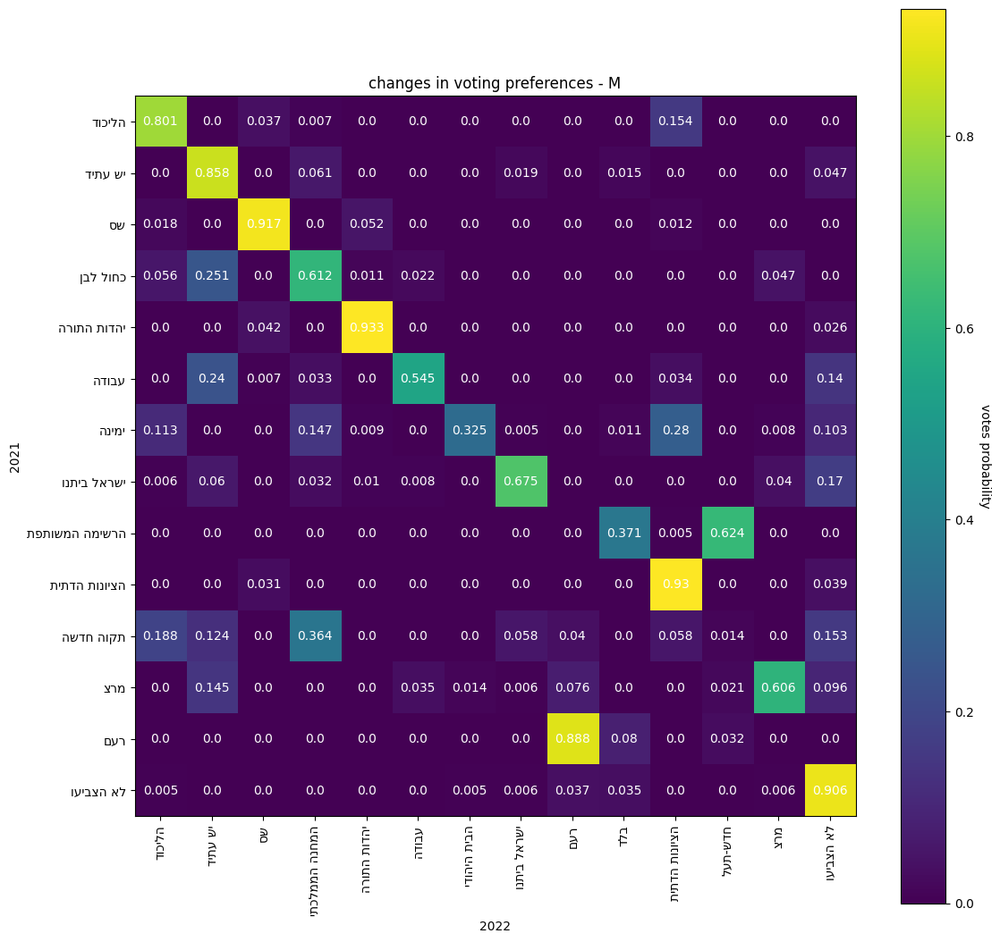

In [162]:
ballot_2021['לא הצביעו'] = ballot_2021['בזב'] - ballot_2021['כשרים']
ballot_2022['לא הצביעו'] = ballot_2022['בזב'] - ballot_2022['כשרים']

names_13_21_nv = np.copy(names_13_21).tolist()
names_13_21_nv.extend(['לא הצביעו'])

names_13_22_nv = np.copy(names_13_22).tolist()
names_13_22_nv.extend(['לא הצביעו'])

names_13_22_nv = ['הליכוד', 'יש עתיד','שס',  'המחנה הממלכתי',
       'יהדות התורה', 'עבודה','הבית היהודי','ישראל ביתנו', 'רעם','בלד','הציונות הדתית', 'חדש-תעל',  'מרצ','לא הצביעו']

names_13_21_nv = ['הליכוד', 'יש עתיד', 'שס', 'כחול לבן', 'יהדות התורה', 'עבודה', 'ימינה',
       'ישראל ביתנו', 'הרשימה המשותפת', 'הציונות הדתית', 'תקוה חדשה', 'מרצ',
       'רעם','לא הצביעו']

#creating matrix of votes
n_a_nv = ballot_2021[names_13_21_nv].values
n_b_nv = ballot_2022[names_13_22_nv].values

# Calculating M
M_nv_a = np.linalg.pinv(n_a_nv.T @ n_a_nv) @n_a_nv.T @ n_b_nv
M_nv = pd.DataFrame(np.where(M_nv_a < 0.005, 0, M_nv_a))
M_nv = M_nv.div(M_nv.sum(axis = 1), 0)
corr_heat_map(M_nv.values, names_13_22_nv, names_13_21_nv)

<font size="4">
the numbers are calculated from a linear regression problem to estimate the votes transfer over the data collected from the ballots (except 'מעטפות חיצוניות'), and they check the voting differences per every ballot between the two elections.

The estimated values obtained by this formula, which minimizes the regression problem as we saw in class:
 $\widehat{M} = [N^{(a)^{T}} N^{(a)}]^{-1}N^{(a)^{T}}N^{(b)} $
</font>

# <h1><center> Part 8 - Significant votes transfers </h1></center>
<font size="4">
Since different parties and ballots may have errors with different variances, the estimation of each entry of the matrix showing how voting trends changed may be noisy, and we need to assess their uncertainty in order to draw conclusions on the true (unknown) parameters. We use bootstrap then, to make a better estimation of the variance of  in order to make a more reliable hypothesis test as it is a more general and robust method for estimation.
</font>

In [163]:
def show_mat_heat_map(M, parties_2022, parties_2021, title, bool = False):
    n_22 = len(parties_2022)
    n_21 = len(parties_2021)

    fig, ax = plt.subplots(figsize = (13,13))
    im = ax.imshow(M, cmap=plt.get_cmap('viridis'))

    ax.set_title(title)
    ax.set_xticks(np.arange(n_22))
    ax.set_yticks(np.arange(n_21))
    # And to label them with the relevant parties names
    ax.set_xticklabels([n[::-1] for n in parties_2022], rotation=90)
    ax.set_yticklabels([n[::-1] for n in parties_2021])
    ax.set_xlabel("2022")
    ax.set_ylabel("2021")

    # Loop over data dimensions to create text annotations.
    if bool :
        for i in range(n_21):
            for j in range(n_22):
                text = ax.text(j, i, round(M[i, j], 3), ha="center", va="center", color="w")

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('votes probability', rotation=-90, va="bottom")

    plt.show()

In [164]:
# Create a bootstrap sample. Sample rows with replacement
def bootstrap(n_a, n_b):
    # sample indices
    bal = np.random.randint(n_b.shape[0], size=n_b.shape[0])
    return n_a[bal,], n_b[bal,]

In [165]:
# Fit the M matrix
def fit_M(n_a, n_b, M_nnls=False, normalize=True):
    if M_nnls:
      M_hat = np.zeros((n_b.shape[1], n_a.shape[1]))
      for j in range(n_b.shape[1]):
        M_hat[j,:], r2 = nnls(n_a, n_b[:,j])
      M_hat = M_hat.T
    else: # fit_method != 'nnls'
      # Fit M on the bootstrap sample
      M_hat = np.linalg.inv(n_a.T @ n_a) @ n_a.T @ n_b

    if normalize:
      # applying constraints
      M_hat = np.where(M_hat < 0.005, 0, M_hat)
#      M_hat = M_hat.div(M_hat.sum(axis = 1), 0)
      M_hat /=  M_hat.sum(axis=1)[:,np.newaxis]

    return M_hat

In [166]:
# Function doing the bootstrap work
def fit_bootstrap_std(n_a, n_b, M_nnls = False, B=100):
  M_hat_sum = np.zeros((n_a.shape[1], n_b.shape[1]))
  M_hat_sum2 = np.zeros((n_a.shape[1], n_b.shape[1]))
  for i in range(B): # loop on bootstrap samples
    # Create a bootstrap sample
    x_boot, y_boot = bootstrap(n_a, n_b)  # create a Bootstrap sample
    M_hat = fit_M(x_boot, y_boot, M_nnls, M_nnls) # normalize only nnls results
    M_hat_sum = M_hat_sum + M_hat
    M_hat_sum2 = M_hat_sum2 + M_hat**2

  return np.sqrt(M_hat_sum2/B - (M_hat_sum/B)**2).T  # compute and return st.d. matrix

In [167]:
# Compute pvalues matrix. We still use the t-distribution (can be replaced by zscores)
def compute_coef_pvals(n_a, n_b, M_nnls = False, normalize = False, B=100, h0_mij = 0):
    M = fit_M(n_a, n_b, M_nnls, normalize)
    if B>0: # use bootstrap
        std_mat = fit_bootstrap_std(n_a, n_b, M_nnls, B)
    else:  # use regression analytic formula
        mse = np.mean((n_a @ M - n_b)**2, axis = 0)
        std_mat = np.array([np.sqrt(i*(np.linalg.inv(n_a.T@n_a)).diagonal()) for i in mse])


    # Compute test statistic and p-value
    std_mat_non_zero = std_mat
    std_mat_non_zero[np.where(std_mat_non_zero <= 0 )] == 0.00001
    if h0_mij == 0:
      t_stat_mat = np.array([M[i,:] /std_mat_non_zero[:,i] for i in range(n_a.shape[1])])  # Test H0: mij=0 (default) or H0: mij = 1 (if input h0_mij is set to one)
    else:
       t_stat_mat = np.array([(h0_mij-M[i,:]) /std_mat_non_zero[:,i] for i in range(n_a.shape[1])])  # Test H0: mij=0 (default) or H0: mij = 1 (if input h0_mij is set to one)

    p_val_mat = stats.t.cdf(-t_stat_mat, n_a.shape[0]-n_b.shape[1])
    p_val_mat = np.where(std_mat.T <= 0, 0.5, p_val_mat) # deal with constant bootstrap values

    if h0_mij == 1: # here test only the diagonal
      t_stat_mat = np.diag(np.diag(t_stat_mat))
      p_val_mat = np.maximum(p_val_mat, 1 - np.identity(p_val_mat.shape[0]))

    return p_val_mat, t_stat_mat, std_mat

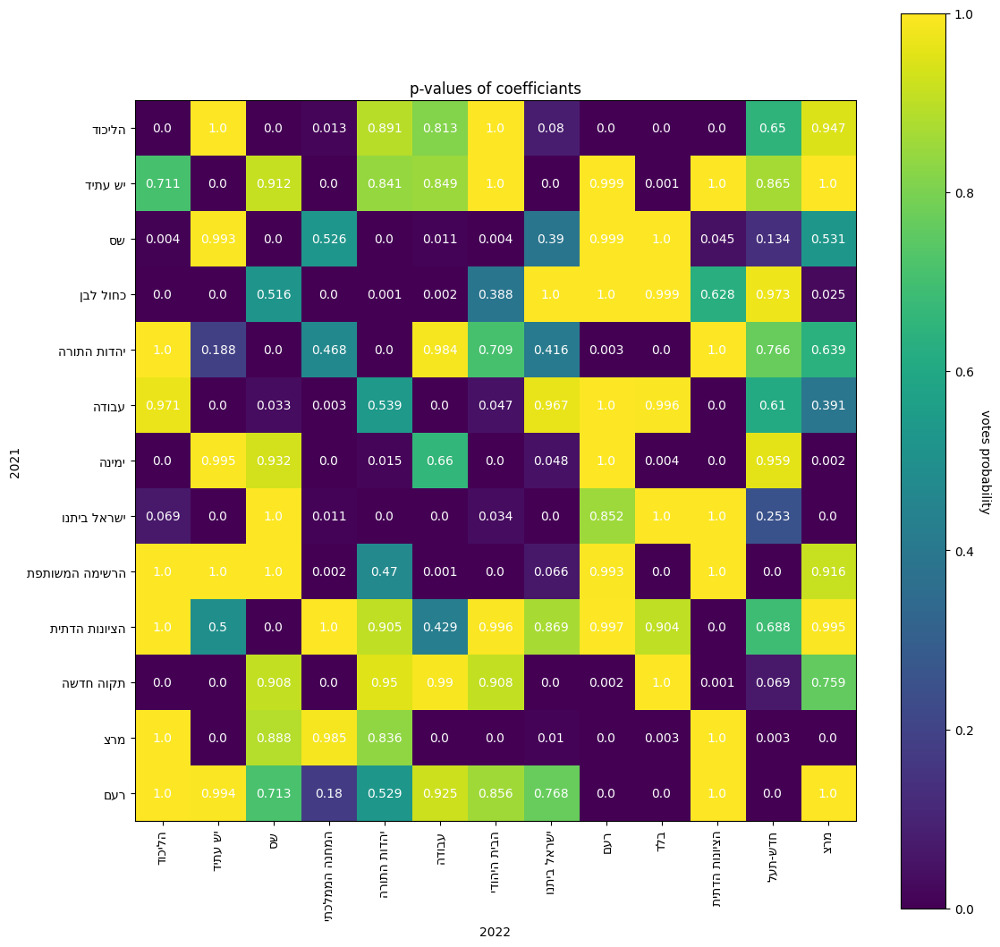

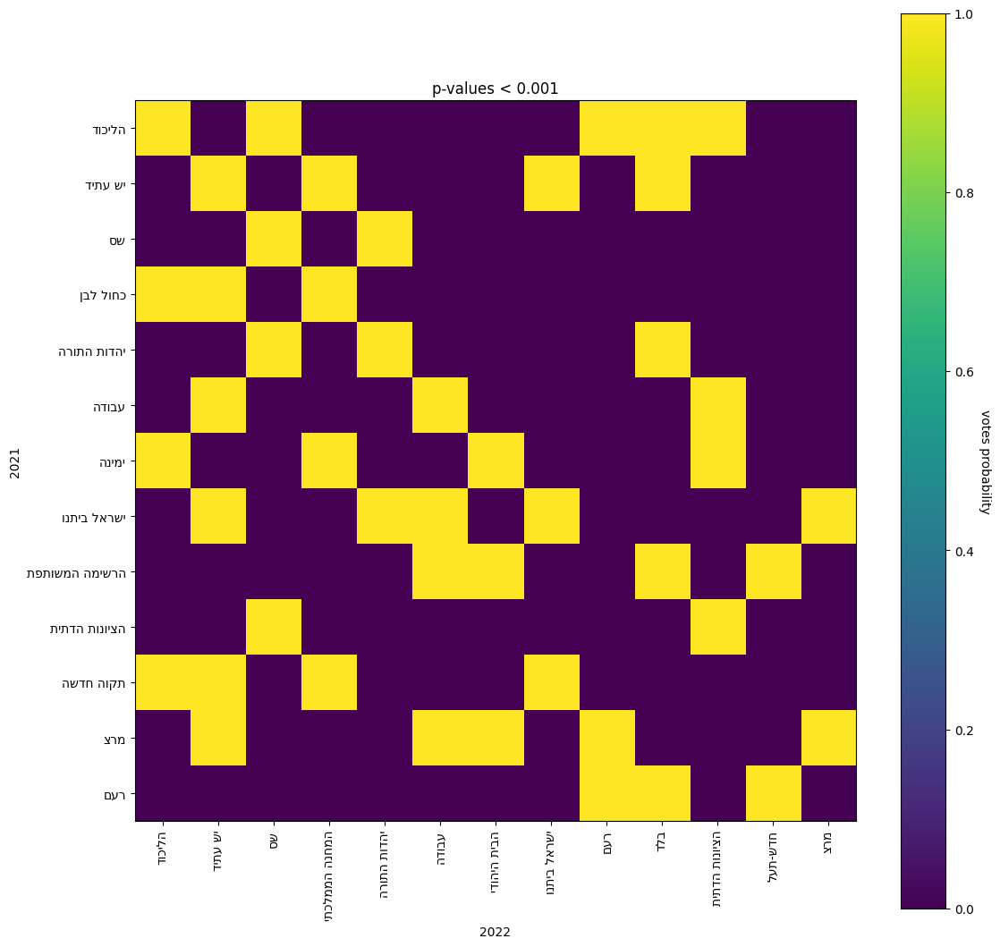

In [168]:
# Compute p-values using bootstrap
p_val_boot, t_stat_boot, std_boot = compute_coef_pvals(n_a, n_b, False, False, 100)

#show_mat_heat_map(std_boot.T, names_13_22, names_13_21, 'std of coefficiants', True)
show_mat_heat_map(p_val_boot, names_13_22, names_13_21, 'p-values of coefficiants',  True)
show_mat_heat_map((p_val_boot<0.001), names_13_22, names_13_21, 'p-values < 0.001')

<font size="4">
The yellow squares indicate vote transfers that are significant for $ \alpha = 0.001 $.
'רעם' party has significant voting transfer with the votes transferred from 'רעם' to 'בלד', 'רעם', and 'חדש=תעל'.
And on the other direction, meaning where 'רעם' voters came from in the election of 2022, a significant voting transfer exists for 'רעם', 'מרץ' and 'הליכוד' - so we do see a small change in compare to the former results

now, we want to check whether our model of predicting voting transfers is good in compare to other Parties.
We will use bootstrap again, for the same reasons. Now we will split the data to 80% - train and 20% - test, which will be the data we will test how good is the prediction of our model, using MSE (describing distances between the real observations and the predicted values).
</font>

In [169]:
ballot_2021['לא הצביעו'] = ballot_2021['בזב'] - ballot_2021['כשרים']
ballot_2022['לא הצביעו'] = ballot_2022['בזב'] - ballot_2022['כשרים']

names_13_21_nv = np.copy(names_13_21).tolist()
names_13_21_nv.extend(['לא הצביעו'])

names_13_22_nv = np.copy(names_13_22).tolist()
names_13_22_nv.extend(['לא הצביעו'])

#creating matrix of votes
n_a_nv = ballot_2021[names_13_21_nv].values
n_b_nv = ballot_2022[names_13_22_nv].values

In [170]:
# Creating train data and test data (split randomly 80% vs. 20%):
train_a, test_a, train_b, test_b = train_test_split(n_a, n_b, train_size = 0.8, random_state = 123)
train_a_nv, test_a_nv, train_b_nv, test_b_nv = train_test_split(n_a_nv, n_b_nv, train_size = 0.8, random_state= 123)

In [171]:
M_1 = fit_M(train_a, train_b, False, True)
M_2 = fit_M(train_a_nv, train_b_nv, False, True)

<AxesSubplot: >

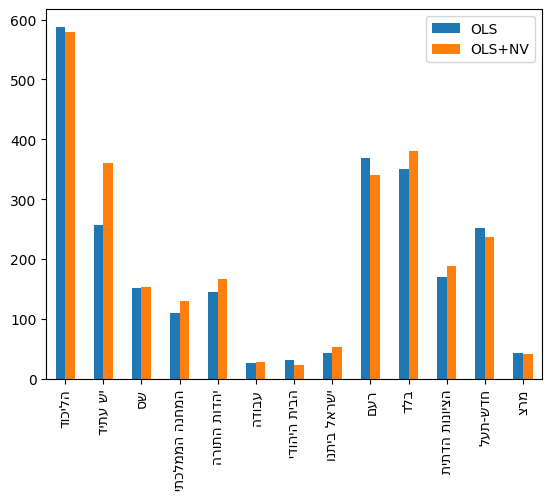

In [172]:
# Calculating and plotting residuals:
mse_123 = pd.DataFrame(np.zeros([13, 2]), columns=["OLS", "OLS+NV"])
res_1 = (test_a @ M_1 - test_b)**2
mse_123["OLS"] = np.mean(res_1, axis = 0)
# M withot no-vote column and row:
M_2_res = np.delete(np.array(M_2), 13, axis=0)
M_2_res = np.delete(M_2_res, 13, 1)
res_2 = (test_a @ M_2_res - test_b)**2
mse_123["OLS+NV"] = np.mean(res_2, axis = 0)
mse_123.index = [name[::-1] for name in list(names_13_22)]
mse_123.plot.bar()

<font size="4">
Calculated both with and without non voters data ( labled "+NV" in the bar plot), in compare to other parties, the MSE for 'רעם' is relatively high. We want a smaller MSE as possible, so the prediction for vote transfers is not so good in compare to other parties. therefore we should take caution while adopting the findings of this chapter in this paper, therefore we tend to use rounded values here, and stick to the main, prominent trends shown in the results.
</font>

# <h1><center> Part 9 - Suspicous ballots </h1></center>

<font size="4">
To check suspicious ballots, first we will verify that there are no ballot with more votes than people with voting rights. After doing so, checked the distance between the voting frequency in a specific ballot and the voting frequency in the same city in 2022. The attached table shows the top ten ballots with the largest distance from the average in that city. For example, in the table you can see that ballot number 951 in the city of Ramla is more than 30% away from the average voting rate for Raam among all polling stations in Ramla, but since Ramla is a large and diverse city, such a situation is possible (for example, in a polling station located in a neighborhood with a Jewish population).
</font>

In [173]:
# Calculate the relative voting frequency per city
city_voting_freq = ballot_22_source.iloc[:, 11:]
city_voting_freq['city'] = ballot_22_source['סמל ישוב']
city_voting_freq = city_voting_freq.groupby('city').sum()
city_voting_freq = city_voting_freq.div(city_voting_freq.sum(axis=1), axis=0)
city_voting_freq = city_voting_freq['רעם'].to_dict()

In [174]:
suspicious_ballot = ballot_22.copy()
suspicious_ballot['city'] = ballot_22_source['סמל ישוב']
suspicious_ballot['ballot'] = ballot_22_source['קלפי']
suspicious_ballot['city_name'] = ballot_22_source['שם ישוב']
suspicious_ballot = suspicious_ballot[['city','ballot','רעם','city_name']]

In [175]:
for index, row in suspicious_ballot.iterrows():
    suspicious_ballot.loc[index, 'Difference from avg'] = abs(row['רעם']-city_voting_freq[row['city']])

In [176]:
suspicious_ballot['Difference from prev year'] = raam_diff['diff']
suspicious_ballot = suspicious_ballot.groupby('city_name').max('Difference from avg')
suspicious_ballot.nlargest(10, 'Difference from avg')      # 10 ballot with largest difference from average voting frequency in the city

,city,ballot,רעם,Difference from avg,Difference from prev year
city_name,,,,,
רמלה,8500,951.0,0.699605,0.640822,0.066474
כאבול,504,10.4,0.825776,0.517081,0.000000
אעבלין,529,13.0,0.694444,0.453260,0.211518
חורה,1303,14.0,0.927536,0.401710,0.000000
סחנין,7500,33.4,0.664179,0.373586,0.000000
רהט,1161,60.0,0.852368,0.371321,0.241678
עכו,7600,80.0,0.437736,0.357219,0.166363
זרזיר,975,9.0,0.909420,0.352246,0.452328
שפרעם,8800,43.0,0.549020,0.347466,0.064269


In [177]:
ballot_amount_dict = ballot_22_source.groupby('סמל ישוב').count()['קלפי'].to_dict()

In [178]:
for index, row in suspicious_ballot.iterrows():
    suspicious_ballot.loc[index, 'Ballots amount'] = ballot_amount_dict[row['city']]
suspicious_ballot.reset_index(inplace=True)

<font size="4">
An additional check that we performed is comparing the data to the 2021 election system. To find suspicious ballots in a clearer way, we created a graph that illustrates the difference from the average voting for the party in that city, and the deviation from that same ballot in the 2021 elections.
</font>

In [179]:
# shows the frequency difference and the amount of ballot in the city. Where we have more ballot we can expect greater variance and therefor be less suspicious.
# The size is by frequency difference from the frequency of the same city in the same year, color is difference between years - so larger and yellow points are more suspicious.
fig = px.scatter(suspicious_ballot, x='Ballots amount', y='Difference from avg', hover_name='city_name', color='Difference from prev year', size='Difference from avg')
fig.show()

<font size="4">
The size of the points represents the deviation from the average vote in that city, and the color of the point represents the deviation from the percentage of the vote in 2021. In addition, the x-axis represents the number of ballots in that city, so the more ballots in the city, the larger the city is likely, and the population there is more diverse, and therefore we can suspect these ballots less.

As a result, we want to look for yellow and large points, such as the point of "Zerzir", where the deviation from the average is 35% and the deviation from the previous year is more than 45%, which could indicate a suspicious ballot.
</font>

<font size="4">
The method used for identifying suspicious ballots is based on comparing the voting frequency for a specific ballot to the average in the city, as well as the voting frequency for the same ballot in the previous year.

 This approach allows for the identification of outliers, which may indicate potential fraud or manipulation. The advantages of this method include the simplicity of the calculation and the ability to identify specific ballots that deviate significantly from the norm. However, this method has some disadvantages as well. It assumes that the previous year's voting patterns are representative of the current year, which may not always be the case.

  It also assumes that the average voting patterns in the city are representative of the overall population, which may not be true for smaller cities or for cities with diverse populations. Alternative methods for identifying suspicious ballots include statistical tests such as chi-squared tests. The results obtained from this method are credible, but a thorough investigation including other methods and evidence should be conducted to confirm or reject potential fraud or manipulation. Another method that can come to mind is calculating the MSE of each city, but since the fraud is happening in specific ballot and not city, it does not make sense to use MSE.
</font>

In [180]:
pio.renderers.default = "notebook"
!jupyter nbconvert --to html --no-prompt --TemplateExporter.exclude_input=True "Final report.ipynb"

[NbConvertApp] Converting notebook Final report.ipynb to html
[NbConvertApp] Writing 11457700 bytes to Final report.html
